# Advanced Lane Line Findings

Note: All the process to detect lane lines in test video is executed in `process_image` function in `Defining image processing method` section. 

github_link:  
https://github.com/tatsuyah/Lane-Lines-Detection-Python-OpenCV    
some useful link:       
https://codertw.com/%E7%A8%8B%E5%BC%8F%E8%AA%9E%E8%A8%80/557658/

## Camera Calibration

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg #mpimg 用于读取图片
from PIL import Image
import glob #用於整理一堆在目錄裡之相同副檔名或類似名稱的檔案

# %matplotlib inline是一个魔法函数（Magic Functions）。官方给出的定义是：
# IPython有一组预先定义好的所谓的魔法函数（Magic Functions），你可以通过命令行的语法形式来访问它们。
# ex. 由于 %matplotlib inline 的存在，当输入plt.plot(x,y_1)后，不必再输入 plt.show()，图像将自动显示出来
%matplotlib inline 

### download dataset

In [ ]:
!gdown --id '1XyT39_FH1cMr83wdcgxrGofDfusbylJp' --output camera_cal.zip
!unzip camera_cal.zip

# !gdown --id '1TrfODqdKyuwu1GE9cpu6gwNLFeQx9iVi' --output test_images.zip
# !unzip test_images.zip

# !gdown --id '1QVfisEIYj7GPpKRJjuv2QBInm83lIYlR' --output 1480.jpg

!gdown --id '1GOCVCHcaHyOsjMaXMCkiH3ego3ZdKUsp' --output 1481.jpg

!gdown --id '1SswbbWBEIQ6tL6IKZMpQ3abxCirkY0X-' --output 1483.jpg

!gdown --id '1DOGI8iahnD4KAzXiijkRieha_w9utHTs' --output 1484.jpg

In [ ]:
# 連到雲端硬碟
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
# folder_path = '/content/gdrive/My Drive/junior_2/Robot_Vision/final project/lane/Lane-Lines-Detection-Python-OpenCV/'
folder_path = '/content/gdrive/My Drive/junior_2/Robot_Vision/final project/lane/result/'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


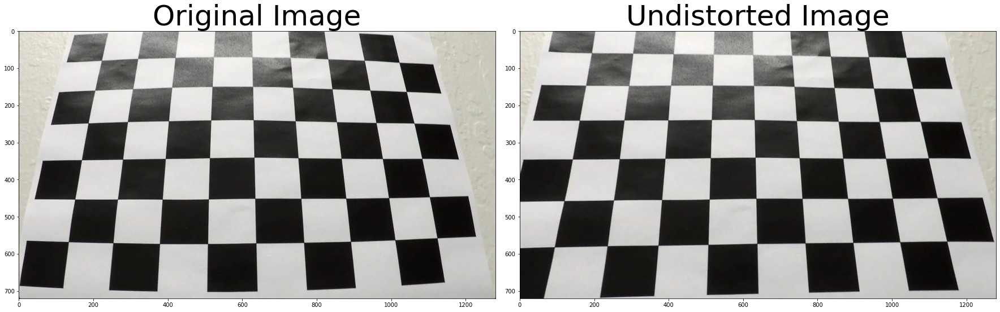

In [ ]:
def cal_undistort(img, objpoints, imgpoints):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) #色彩空间转化函数 cv2.cvtColor( )进行色彩空间的转换，這邊轉換成灰階
    # 我们使用cv2.calibrateCamera()进行标定，这个函数会返回标定结果、相机的内参数矩阵、畸变系数、旋转矩阵和平移向量。
    # calibrateCamera(InputArrayOfArrays objectPoints, InputArrayOfArrays imagePoints,Size imageSize, InputOutputArray cameraMatrix, 
    #                 InputOutputArray distCoeffs, OutputArrayOfArrays rvecs, OutputArrayOfArrays tvecs, int flags=0)

    # objectPoints为世界坐标系中的点。在使用时，应该输入一个三维点的vector的vector，即vector<vector<Point3f>> objectPoints。
    # imagePoints为其对应的图像点。和objectPoints一样，应该输入std::vector<std::vector<cv::Point2f>> imagePoints型的变量。
    # imageSize为图像的大小，在计算相机的内参数和畸变矩阵需要用到；
    # cameraMatrix为内参数矩阵。输入一个cv::Mat cameraMatrix即可。
    # distCoeffs为畸变矩阵。输入一个cv::Mat distCoeffs即可。
    # rvecs为旋转向量；应该输入一个cv::Mat的vector，即vector<cv::Mat> rvecs因为每个vector<Point3f>会得到一个rvecs。
    # tvecs为位移向量；和rvecs一样，也应该为vector<cv::Mat> tvecs。
    # flags为标定是所采用的算法。
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None,None)

    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx, dist

def collect_callibration_points():
    objpoints = [] # 儲存3D點 
    imgpoints = [] # 儲存2D點
   
    # images = glob.glob(folder_path + 'camera_cal/calibration*.jpg')
    images = glob.glob('camera_cal/calibration*.jpg') #合併資料拿取
    objp = np.zeros((6*9,3), np.float32) #創建一個 [54, 3] 的 zero matrix，並且型態為 float32
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1, 2) #objp[:,:2] = sets the 0th and 1th columns of objp to this result.

    # np.mgrid[0:9,0:6]
    # array([[[0, 0, 0, 0, 0, 0],
    #     [1, 1, 1, 1, 1, 1],
    #     [2, 2, 2, 2, 2, 2],
    #     [3, 3, 3, 3, 3, 3],
    #     [4, 4, 4, 4, 4, 4],
    #     [5, 5, 5, 5, 5, 5],
    #     [6, 6, 6, 6, 6, 6],
    #     [7, 7, 7, 7, 7, 7],
    #     [8, 8, 8, 8, 8, 8]]

    #    [[0, 1, 2, 3, 4, 5],
    #     [0, 1, 2, 3, 4, 5],
    #     [0, 1, 2, 3, 4, 5],
    #     [0, 1, 2, 3, 4, 5],
    #     [0, 1, 2, 3, 4, 5],
    #     [0, 1, 2, 3, 4, 5],
    #     [0, 1, 2, 3, 4, 5],
    #     [0, 1, 2, 3, 4, 5],
    #     [0, 1, 2, 3, 4, 5]]])
    # T.reshape(-1, 2) => reshape to an Nx2 matrix
    
    for fname in images:
        img = mpimg.imread(fname)

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # findChessboardCorners  ( InputArray  image,  Size  patternSize, OutputArray  corners,      
        #                         int flags = CALIB_CB_ADAPTIVE_THRESH+CALIB_CB_NORMALIZE_IMAGE) 
        # 这个函数用来检测一幅图像中是否含有棋盘格，如果图像中不含有指定数目的棋盘格角点（即黑色方块相交的点为角点，因此制作标定板时，
        # 最好选用大一点白色或浅色木板作为棋盘格背景）或对它们排序失败时，函数返回0; 如果图像中棋盘格内部角点都被确定了位置并准确排列的话，
        # 该函数将它们按制定行列排序并存储在corners向量中。该函数确定的角点的大概位置（approximate），
        # 如果想更准确地确定角点的位置，你可以该函数检测角点成功后继续调用cornerSubPix函数。
      
        # 参数： 
        # image：8位灰度图像或彩色图像。 
        # patternSizeNumber： 棋盘格内部角点的行和列，( patternSize =  cvSize(points_per_row, points_per_colum) = cvSize(columns,rows) )。 
        # cornersOutput：检测到的角点存储的数组， 
        # flags：棋盘格检测角点方法设置标置位
        #     CALIB_CB_ADAPTIVE_THRESH 使用自适应阈值将灰度图像转化为二值图像，而不是固定的由图像的平均亮度计算出来的阈值
        #     CALIB_CB_NORMALIZE_IMAGE 在利用固定阈值或者自适应的阈值进行二值化之前，先使用equalizeHist来均衡化图像gamma值。 
        #     CALIB_CB_FILTER_QUADS 使用其他的准则（如轮廓面积，周长，类似方形的形状）来去除在轮廓检测阶段检测到的错误方块。 
        #     CALIB_CB_FAST_CHECK 在图像上快速检测一下棋盘格角点，如果没有棋盘格焦点被发现，绕过其它费时的函数调用，
        #     这可以在图像没有棋盘格被观测以及恶劣情况下缩短整个函数执行时间。
        ret, corners = cv2.findChessboardCorners(gray, (9, 6), None) #找到棋盘格角点

        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
        
    return imgpoints, objpoints

def compare_images(image1, image2, image1_exp="Image 1", image2_exp="Image 2"):

    #在空白fig製圖
    # fig, axes = plt.subplots(nrows=1,ncols=2)
    # axes等於axes的array
    # 因此可以用for loop來重複操作這個array
    # for ax in axes:
    #   ax.plot(x,y,'r')
    #   ax.set_xlabel('x')
    #   ax.set_ylabel('y')
    #   ax.set_title('title')
      
    # 顯示圖表 fig
    #避免兩個圖重疊，使用tight_layout分開 plt.tight_layout()
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image1)
    ax1.set_title(image1_exp, fontsize=50)
    ax2.imshow(image2)
    ax2.set_title(image2_exp, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

    
imgpoints, objpoints = collect_callibration_points()
# img = mpimg.imread(folder_path + 'camera_cal/calibration3.jpg')
img = mpimg.imread('camera_cal/calibration3.jpg')
undistorted, mtx, dist_coefficients = cal_undistort(img, objpoints, imgpoints)
compare_images(img, undistorted, "Original Image", "Undistorted Image")

# image_path = 'test_images/straight_lines1.jpg'
image_path = '1481.jpg'
# image_path = '1483.jpg'
# image_path = '1484.jpg'

image = mpimg.imread(image_path)
image, mtx, dist_coefficients = cal_undistort(image, objpoints, imgpoints)

## Gradient Thresholds

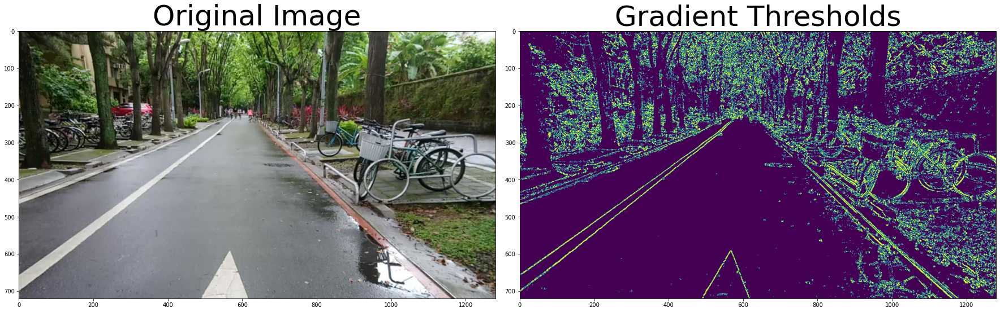

In [ ]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    isX = True if orient == 'x' else False

    # 函数返回其处理结果。
    # 前四个是必须的参数：
    # 第一个参数是需要处理的图像；
    # 第二个参数是图像的深度，-1表示采用的是与原图像相同的深度。目标图像的深度必须大于等于原图像的深度；
    # dx和dy表示的是求导的阶数，0表示这个方向上没有求导，一般为0、1、2。
    sobel = cv2.Sobel(gray, cv2.CV_64F, isX, not isX)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel)) #np.unit8 =>  8 位无符号整数
    grad_binary = np.zeros_like(scaled_sobel) #np.zeros_like(ndarray)，依據給定陣列(a)的形狀和型別返回一個新的元素全部為0的陣列。
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
   
    return grad_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel) #kernal_size = 3
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) #kernal_size = 3
    abs_sobel = np.sqrt(sobelx**2 + sobely**2)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel)) 
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1

    return mag_binary

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1

    return dir_binary

def apply_thresholds(image, ksize=3):
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

combined = apply_thresholds(image)
compare_images(image, combined, "Original Image", "Gradient Thresholds")

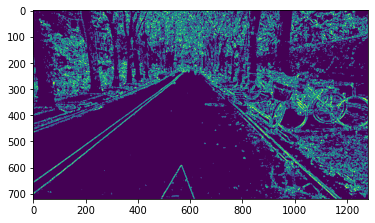

In [ ]:
plt.imshow(combined)
plt.savefig(folder_path + 'Gradient Thresholds_Color Threshold_Combine Color and Gradient/1481_only_g.png')

## Color Threshold

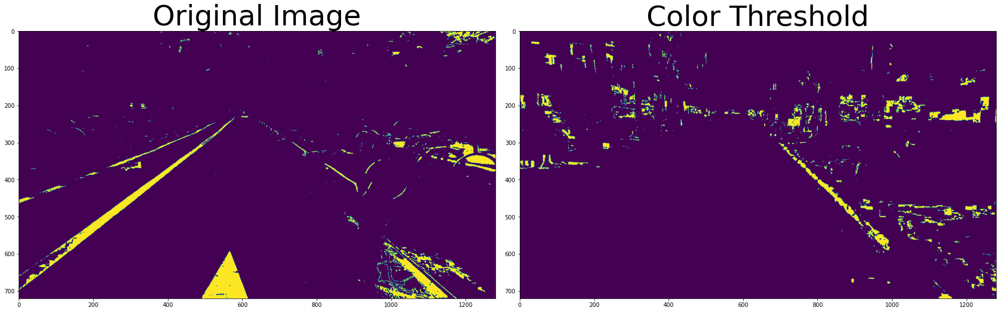

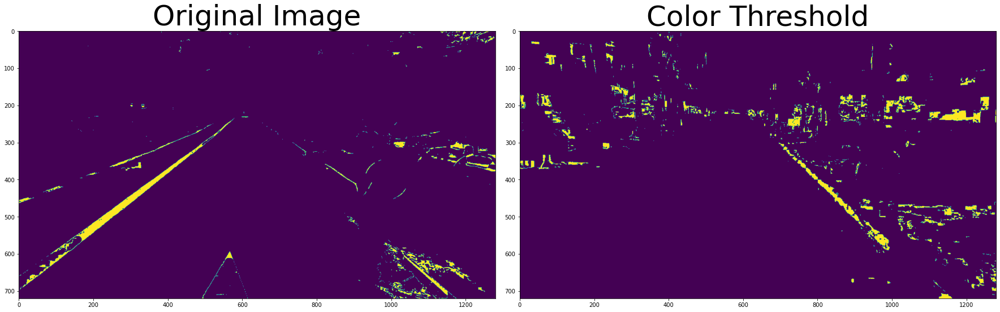

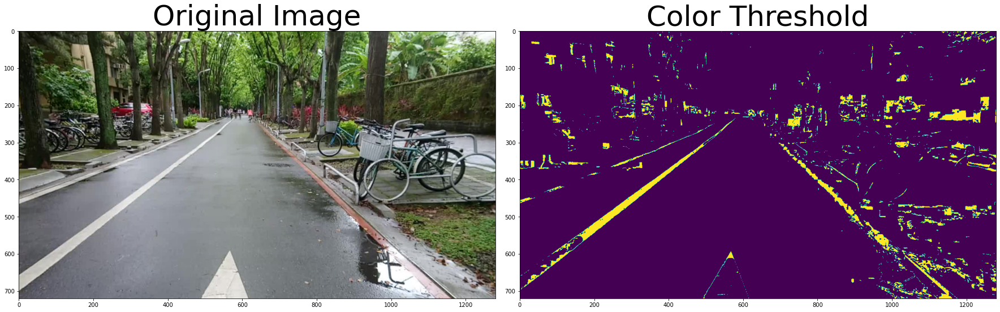

In [ ]:
def apply_color_threshold(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    #s_channel = hls[:,:,2]
    ###################################################################################
    #s_thresh_min = 180
    #s_thresh_max = 250
    ###################################################################################
    #s_binary = np.zeros_like(s_channel)
    #s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    h_channel = hls[:,:,0]
    s_channel = hls[:,:,1]
    v_channel = hls[:,:,2]

    s_thresh_min_red = 20
    s_thresh_max_red = 100
    h_thresh_min_red = 0
    h_thresh_max_red = 7
    h_thresh_min_red_2 = 170
    h_thresh_max_red_2 = 180    

    s_thresh_min_yellow = 100
    s_thresh_max_yellow = 230
    h_thresh_min_yellow = 20
    h_thresh_max_yellow = 30

    s_thresh_min_white = 0
    s_thresh_max_white = 30
    v_thresh_min_white = 200
    v_thresh_max_white = 245

    s_binary_w = np.zeros_like(s_channel)
    s_binary_o = np.zeros_like(s_channel)
    s_binary_w[((s_channel >= s_thresh_min_white) & (s_channel <= s_thresh_max_white) & (v_channel >= v_thresh_min_white) & (v_channel <= v_thresh_max_white))] = 1
    s_binary_o[((s_channel >= s_thresh_min_red) & (s_channel <= s_thresh_max_red) & ((h_channel >= h_thresh_min_red) & (h_channel <= h_thresh_max_red) | (h_channel >= h_thresh_min_red_2) & (h_channel <= h_thresh_max_red_2))) | ((s_channel >= s_thresh_min_yellow) & (s_channel <= s_thresh_max_yellow) & (h_channel >= h_thresh_min_yellow) & (h_channel <= h_thresh_max_yellow))] = 1

    return s_binary_w, s_binary_o
    
    
s_binary_w, s_binary_o = apply_color_threshold(image) 
compare_images(s_binary_w, s_binary_o, "Original Image", "Color Threshold")

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(10,10))
s_binary_t = cv2.dilate(s_binary_w,kernel)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(35,35))
s_binary_t = cv2.erode(s_binary_t,kernel)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(20,20))
s_binary_t = cv2.dilate(s_binary_t,kernel)


s_binary = s_binary_w ^ s_binary_t
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(2,2))
s_binary = cv2.erode(s_binary,kernel)
compare_images(s_binary, s_binary_o, "Original Image", "Color Threshold")
s_binary = s_binary | s_binary_o

compare_images(image, s_binary, "Original Image", "Color Threshold")


## 改成針對白、黃、紅色線
# 紅 0度 S高
# 黃 60度 S高
# 白 S低 V高

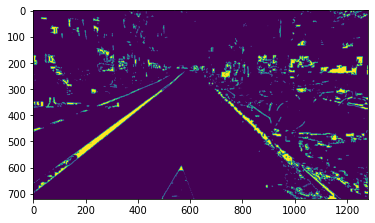

In [ ]:
plt.imshow(s_binary)
plt.savefig(folder_path + 'Gradient Thresholds_Color Threshold_Combine Color and Gradient/1481_only_c.png')

## Combine Color and Gradient

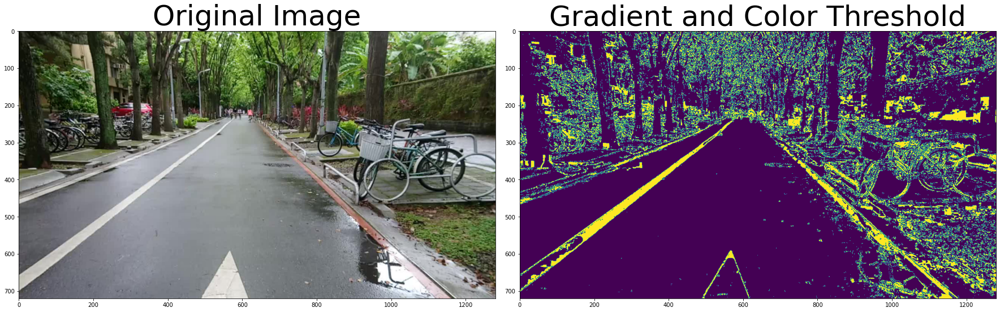

In [ ]:
def combine_threshold(s_binary, combined):
    combined_binary = np.zeros_like(combined)
    combined_binary[(s_binary == 1) | (combined == 1)] = 1

    return combined_binary


combined_binary = combine_threshold(s_binary, combined)
compare_images(image, combined_binary, "Original Image", "Gradient and Color Threshold")

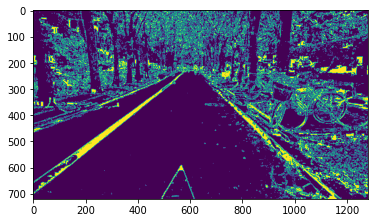

In [ ]:
plt.imshow(combined_binary)
plt.savefig(folder_path + 'Gradient Thresholds_Color Threshold_Combine Color and Gradient/1481_g_c.png')

## Perspective Transform

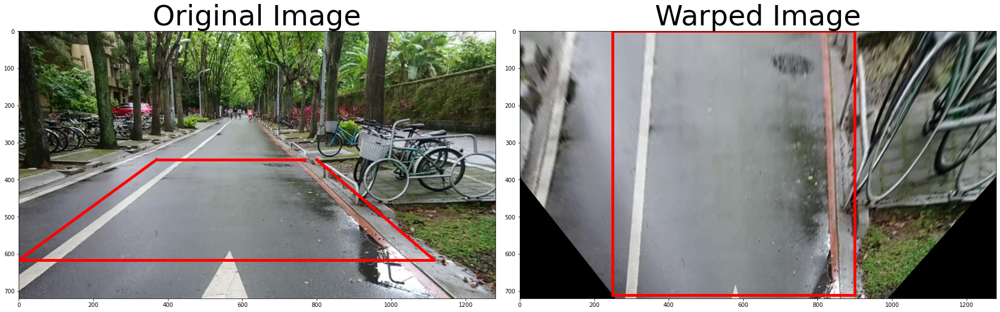

In [ ]:
def warp(img):
  # shape函数是numpy.core.fromnumeric中的函数，它的功能是读取矩阵的长度，比如shape[0]就是读取矩阵第一维度的长度。
  # shape的输入参数可以是一个整数（表示维度），也可以是一个矩阵
    img_size = (img.shape[1], img.shape[0])

    # original
    # src = np.float32(
    #     [[685, 450], 
    #       [1090, 710], 
    #       [220, 710], 
    #       [595, 450]])

    # 1480
    # src = np.float32(
    #     [[950, 300], 
    #       [1270, 570], 
    #       [50, 570], 
    #       [300, 300]])

    # 1481
    src = np.float32(
        [[800, 346], 
          [1115, 616], 
          [1, 616], 
          [370, 346]])

    # # 1483
    # src = np.float32(
    #     [[768, 500], 
    #       [1010, 677], 
    #       [85, 677], 
    #       [385, 500]])
    
    # # 1484
    # src = np.float32(
    #     [[746, 395], 
    #       [984, 616], 
    #       [166, 616], 
    #       [417, 395]])
       
    dst = np.float32(
        [[900, 0], 
          [900, 710], 
          [250, 710], 
          [250, 0]])
       
    # 透视变换(Perspective Transformation)是将成像投影到一个新的视平面(Viewing Plane)，
    # 也称作投影映射(Projective Mapping)。如图1，通过透视变换ABC变换到A'B'C'。用於轉換視角

    # 1. 计算得到转换矩阵
    M = cv2.getPerspectiveTransform(src, dst) #(源图像四个顶点坐标（点数组), #目标图像上四个顶点的坐标（点数组）)
    Minv = cv2.getPerspectiveTransform(dst, src) 
    
    # 2. 实现透视变换转换
    binary_warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
   
    return binary_warped, Minv

def compare_plotted_images(image1, image2, image1_exp="Image 1", image2_exp="Image 2"):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image1)
    # 1481
    ax1.plot([800, 1115], [346, 616], color='r', linewidth="5")
    ax1.plot([1115, 1], [616, 616], color='r', linewidth="5")
    ax1.plot([1, 370], [616, 346], color='r', linewidth="5")
    ax1.plot([370, 768], [346, 346], color='r', linewidth="5")
    ax1.set_title(image1_exp, fontsize=50)

    # # 1483
    # ax1.plot([768, 1010], [500, 677], color='r', linewidth="5")
    # ax1.plot([1010, 85], [677, 677], color='r', linewidth="5")
    # ax1.plot([85, 385], [677, 500], color='r', linewidth="5")
    # ax1.plot([385, 768], [500, 500], color='r', linewidth="5")
    # ax1.set_title(image1_exp, fontsize=50)

    # # 1484
    # ax1.plot([746, 984], [395, 616], color='r', linewidth="5")
    # ax1.plot([984, 166], [616, 616], color='r', linewidth="5")
    # ax1.plot([166, 417], [616, 395], color='r', linewidth="5")
    # ax1.plot([417, 746], [395, 395], color='r', linewidth="5")
    # ax1.set_title(image1_exp, fontsize=50)

    ax2.imshow(image2)
    ax2.plot([900, 900], [0, 710], color='r', linewidth="5")
    ax2.plot([900, 250], [710, 710], color='r', linewidth="5")
    ax2.plot([250, 250], [710, 0], color='r', linewidth="5")
    ax2.plot([250, 900], [0, 0], color='r', linewidth="5")
    ax2.set_title(image2_exp, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    
warped, Minv = warp(image)
compare_plotted_images(image, warped, "Original Image", "Warped Image")
plt.savefig(folder_path + 'Perspective Transform /1481_PT.png')

# Finding the Lines

## Histogram

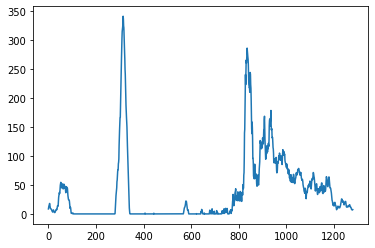

In [ ]:
def get_histogram(binary_warped):
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0) #當axis為0時,是壓縮行,即將每一列的元素相加,將矩陣壓縮為一行
    
    return histogram
    
    
binary_warped, Minv = warp(combined_binary)
histogram = get_histogram(binary_warped)
plt.plot(histogram)
plt.savefig(folder_path + 'Histogram/1481_H.png')

## Sliding Window

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


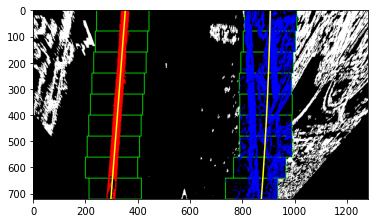

In [ ]:
def slide_window(binary_warped, histogram):
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255 #等价于：np.concatenate(tup, axis=2)
    midpoint = np.int(histogram.shape[0]/2) #histogram 第一維轉成 int
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)
    nonzero = binary_warped.nonzero() #取出矩陣中的非零元素的座標
    nonzeroy = np.array(nonzero[0]) #取出所有 x 座標
    nonzerox = np.array(nonzero[1]) #取出所有 y 座標
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 100
    minpix = 50
    left_lane_inds = []
    right_lane_inds = []

    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    return ploty, left_fit, right_fit

ploty, left_fit, right_fit = slide_window(binary_warped, histogram)
plt.savefig(folder_path + 'Sliding Window_Skipping Slinding Window/1481_SW.png')

## Skipping Slinding Window

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


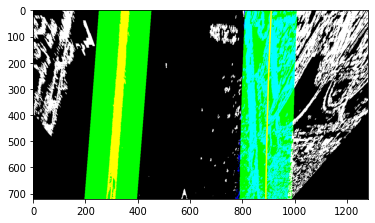

In [ ]:
def skip_sliding_window(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
  
    
    ################################ 
    ## Visualization
    ################################ 
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    ret = {}
    ret['leftx'] = leftx
    ret['rightx'] = rightx
    ret['left_fitx'] = left_fitx
    ret['right_fitx'] = right_fitx
    ret['ploty'] = ploty
    
    return ret

draw_info = skip_sliding_window(binary_warped, left_fit, right_fit)
plt.savefig(folder_path + 'Sliding Window_Skipping Slinding Window/1481_SSW.png')

## Measuring Curvature

In [ ]:
def measure_curvature(ploty, lines_info):
    ym_per_pix = 30/720 
    xm_per_pix = 3.7/700 

    leftx = lines_info['left_fitx']
    rightx = lines_info['right_fitx']

    leftx = leftx[::-1]  
    rightx = rightx[::-1]  

    y_eval = np.max(ploty)
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    print(left_curverad, 'm', right_curverad, 'm')
    
    return left_curverad, right_curverad
    
left_curverad, right_curverad = measure_curvature(ploty, draw_info)

30774.278702067193 m 6627.082263299872 m


## Drawing

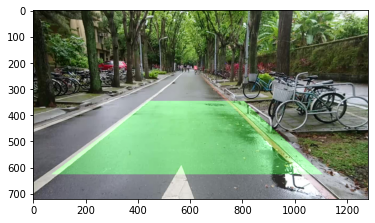

In [ ]:
def draw_lane_lines(original_image, warped_image, Minv, draw_info):
    leftx = draw_info['leftx']
    rightx = draw_info['rightx']
    left_fitx = draw_info['left_fitx']
    right_fitx = draw_info['right_fitx']
    ploty = draw_info['ploty']
    
    warp_zero = np.zeros_like(warped_image).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    newwarp = cv2.warpPerspective(color_warp, Minv, (original_image.shape[1], original_image.shape[0])) 
    result = cv2.addWeighted(original_image, 1, newwarp, 0.3, 0)
    
    return result


result = draw_lane_lines(image, binary_warped, Minv, draw_info)
plt.imshow(result)
plt.savefig(folder_path + 'Drawing/1481_D.png')

## Defining image processing method

In [ ]:
global used_warped
global used_ret

def process_image(image):
    global used_warped
    global used_ret
    
    #Undistort image
    image, mtx, dist_coefficients = cal_undistort(image, objpoints, imgpoints)
    
    # Gradient thresholding
    gradient_combined = apply_thresholds(image)
   
    # Color thresholding
    s_binary = apply_color_threshold(image)
    
    # Combine Gradient and Color thresholding
    combined_binary = combine_threshold(s_binary, gradient_combined)
   
    # Transforming Perspective
    binary_warped, Minv = warp(combined_binary)
  
    # Getting Histogram
    histogram = get_histogram(binary_warped)
  
    # Sliding Window to detect lane lines
    ploty, left_fit, right_fit = slide_window(binary_warped, histogram)
    
    # Skipping Sliding Window
    ret = skip_sliding_window(binary_warped, left_fit, right_fit)
   
    # Measuring Curvature
    left_curverad, right_curverad = measure_curvature(ploty, ret)
    
     # Sanity check: whether the lines are roughly parallel and have similar curvature
    slope_left = ret['left_fitx'][0] - ret['left_fitx'][-1]
    slope_right = ret['right_fitx'][0] - ret['right_fitx'][-1]
    slope_diff = abs(slope_left - slope_right)
    slope_threshold = 150
    curve_diff = abs(left_curverad - right_curverad)
    curve_threshold = 10000
    
    # if (slope_diff > slope_threshold or curve_diff > curve_threshold):
    #     binary_warped = used_warped
    #     ret = used_ret
   
    # Visualizing Lane Lines Info
    result = draw_lane_lines(image, binary_warped, Minv, ret)
    
    # Annotating curvature 
    fontType = cv2.FONT_HERSHEY_SIMPLEX
    curvature_text = 'The radius of curvature = ' + str(round(left_curverad, 3)) + 'm'
    cv2.putText(result, curvature_text, (30, 60), fontType, 1.5, (255, 255, 255), 3)
   
    # Annotating deviation
    deviation_pixels = image.shape[1]/2 - abs(ret['right_fitx'][-1] - ret['left_fitx'][-1])
    xm_per_pix = 3.7/700 #自己量比例尺
    deviation = deviation_pixels * xm_per_pix
    direction = "left" if deviation < 0 else "right"
    deviation_text = 'Vehicle is ' + str(round(abs(deviation), 3)) + 'm ' + direction + ' of center'
    cv2.putText(result, deviation_text, (30, 110), fontType, 1.5, (255, 255, 255), 3)
    
    used_warped = binary_warped
    used_ret = ret
    
    return result 

# result_image = process_image(image)
# plt.imshow(result_image)

## Applying to Video 

In [ ]:
import imageio
imageio.plugins.ffmpeg.download()
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
# !gdown --id '12ictKHlyHm6xzxUdmNSUO9bz8ErExOi1' --output lane_test_1.mp4
# !gdown --id '1U4qvCSNyMqpKd2af2fEsqYiE0AqZpkJJ' --output lane_test_2.mp4
# !gdown --id '1XMOi01B5V9eVwyDOFKiOOaa4t6eiXI0P' --output lane_test_3.mp4
# !gdown --id '1Um-O96zSJipPVg6dxT9FBw2hvqLzA_xX' --output MOV_1481.mp4
# !gdown --id '1zG5-zMd0QP7OG2B-uzK1wJuJRZ_41IyG' --output MOV_1483.mp4
!gdown --id '1y7MU-Lyn22Xt1cUvB57McIIgPi2QAvpe' --output MOV_1484.mp4

Downloading...
From: https://drive.google.com/uc?id=1y7MU-Lyn22Xt1cUvB57McIIgPi2QAvpe
To: /content/MOV_1484.mp4
16.8MB [00:00, 166MB/s]


finish VideoFileClip


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


503.8769816123207 m 165.80593853595747 m
finish clip.fl_image
[MoviePy] >>>> Building video result_1484.mp4
[MoviePy] Writing video result_1484.mp4


  0%|          | 0/117 [00:00<?, ?it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  1%|          | 1/117 [00:01<02:53,  1.49s/it]

503.8769816123207 m 165.80593853595747 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  2%|▏         | 2/117 [00:03<02:52,  1.50s/it]

14314.44234875571 m 236.76120782845 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  3%|▎         | 3/117 [00:04<02:50,  1.49s/it]

410.60500390602016 m 167.805542622137 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  3%|▎         | 4/117 [00:05<02:48,  1.49s/it]

311.04814530588635 m 143.7077893973737 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  4%|▍         | 5/117 [00:07<02:47,  1.49s/it]

351.4495966534616 m 190.39056578267582 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  5%|▌         | 6/117 [00:08<02:45,  1.49s/it]

297.5789680660639 m 133.1401826032311 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  6%|▌         | 7/117 [00:10<02:43,  1.49s/it]

804.9807272770073 m 153.00547397080098 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  7%|▋         | 8/117 [00:12<02:58,  1.64s/it]

356.97022878979146 m 125.57430552838855 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  8%|▊         | 9/117 [00:14<03:17,  1.83s/it]

268.6509850535955 m 121.27783898347795 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  9%|▊         | 10/117 [00:16<03:09,  1.77s/it]

414.4580296462991 m 251.62258123877487 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
  9%|▉         | 11/117 [00:17<02:58,  1.68s/it]

268.3115481810775 m 108.86540023011169 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 10%|█         | 12/117 [00:19<02:50,  1.62s/it]

289.60241722834843 m 147.54234875320398 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 11%|█         | 13/117 [00:20<02:44,  1.59s/it]

285.6528430547731 m 114.80542392406146 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 12%|█▏        | 14/117 [00:22<02:40,  1.56s/it]

494.57216700385203 m 365.1743102306473 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 13%|█▎        | 15/117 [00:23<02:38,  1.55s/it]

1367.9528967251738 m 145.78886562784479 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 14%|█▎        | 16/117 [00:25<02:36,  1.55s/it]

360.21658330744447 m 191.96004039433706 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 15%|█▍        | 17/117 [00:26<02:33,  1.53s/it]

373.33749804593106 m 127.40445235445861 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 15%|█▌        | 18/117 [00:28<02:29,  1.51s/it]

361.91531762961705 m 195.63687417205753 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 16%|█▌        | 19/117 [00:29<02:26,  1.50s/it]

10581.842329592546 m 98.24814919505562 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 17%|█▋        | 20/117 [00:31<02:25,  1.50s/it]

348.2850554056981 m 647.2316439432427 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 18%|█▊        | 21/117 [00:32<02:23,  1.49s/it]

1539.430519473594 m 637.0268542817204 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 19%|█▉        | 22/117 [00:34<02:21,  1.49s/it]

3103.9375561201064 m 8007.332208572124 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 20%|█▉        | 23/117 [00:35<02:19,  1.49s/it]

1250.1162190195855 m 145.03398992703637 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 21%|██        | 24/117 [00:37<02:18,  1.49s/it]

1374.7066237652075 m 150.21540728018243 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 21%|██▏       | 25/117 [00:38<02:16,  1.48s/it]

533.7286211080209 m 129.9335447592077 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 22%|██▏       | 26/117 [00:40<02:14,  1.48s/it]

13123.35774777778 m 135.1610076520245 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 23%|██▎       | 27/117 [00:41<02:13,  1.48s/it]

564.6824297146228 m 1098.2411800837283 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 24%|██▍       | 28/117 [00:43<02:11,  1.48s/it]

562.0427648842851 m 184.87990438031903 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 25%|██▍       | 29/117 [00:44<02:10,  1.48s/it]

953.1377162936434 m 130.94561726159418 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 26%|██▌       | 30/117 [00:46<02:08,  1.47s/it]

947.4769619502711 m 3386.745287030924 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 26%|██▋       | 31/117 [00:47<02:07,  1.48s/it]

3218.2860066257176 m 1542.5556248964751 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 27%|██▋       | 32/117 [00:49<02:05,  1.48s/it]

1190.6226899062704 m 1372.118648742548 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 28%|██▊       | 33/117 [00:50<02:03,  1.48s/it]

2205.7213706957386 m 113.4810063703185 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 29%|██▉       | 34/117 [00:51<02:02,  1.47s/it]

2844.2019816212264 m 275.40157600174155 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 30%|██▉       | 35/117 [00:53<02:02,  1.50s/it]

1366.5373291175476 m 661.612679517806 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 31%|███       | 36/117 [00:55<02:01,  1.50s/it]

1014.9302763343247 m 5396.059248945866 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 32%|███▏      | 37/117 [00:56<02:00,  1.50s/it]

5411.363238429705 m 1471.5230243168257 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 32%|███▏      | 38/117 [00:58<01:58,  1.50s/it]

346.3748188853444 m 150.9667096189914 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 33%|███▎      | 39/117 [00:59<01:57,  1.51s/it]

306.1509358765007 m 464.5356134798258 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 34%|███▍      | 40/117 [01:01<01:56,  1.51s/it]

315.6617705881173 m 435.2437520078967 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 35%|███▌      | 41/117 [01:02<01:54,  1.51s/it]

414.2748224735486 m 2065.029750628968 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 36%|███▌      | 42/117 [01:04<01:52,  1.50s/it]

403.10813687891533 m 1707.6935242808847 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 37%|███▋      | 43/117 [01:05<01:55,  1.57s/it]

359.66880686579003 m 197.08089829093998 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 38%|███▊      | 44/117 [01:07<01:52,  1.54s/it]

278.20037615706843 m 1154.5750340395957 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 38%|███▊      | 45/117 [01:08<01:49,  1.52s/it]

236.12924602687627 m 720.3533879428545 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 39%|███▉      | 46/117 [01:10<01:46,  1.51s/it]

1981.7911374331936 m 662.049866019595 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 40%|████      | 47/117 [01:11<01:45,  1.51s/it]

1312.127738759289 m 171.4372473439925 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 41%|████      | 48/117 [01:13<01:45,  1.53s/it]

1393.2463929530318 m 3730.3956573704877 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 42%|████▏     | 49/117 [01:14<01:45,  1.55s/it]

1262.3930959746342 m 601.7803522893988 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 43%|████▎     | 50/117 [01:16<01:43,  1.54s/it]

1999.5718166673516 m 1535.7907663340904 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 44%|████▎     | 51/117 [01:17<01:41,  1.54s/it]

824.3177707260538 m 304.07076077580444 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 44%|████▍     | 52/117 [01:19<01:41,  1.56s/it]

856.7273480341734 m 418.8895206952778 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 45%|████▌     | 53/117 [01:21<01:39,  1.56s/it]

5508.675421009952 m 220.84616100080805 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 46%|████▌     | 54/117 [01:22<01:37,  1.54s/it]

3018.0502745711647 m 244.5105320772924 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 47%|████▋     | 55/117 [01:24<01:35,  1.54s/it]

888.4169835414801 m 115.94814291096294 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 48%|████▊     | 56/117 [01:25<01:35,  1.56s/it]

589.6949201334754 m 63.33722263640865 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 49%|████▊     | 57/117 [01:27<01:33,  1.56s/it]

1111.9850308872092 m 62.87846423950847 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 50%|████▉     | 58/117 [01:28<01:31,  1.55s/it]

7202.554778875114 m 480.2685569452964 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 50%|█████     | 59/117 [01:30<01:29,  1.54s/it]

717.1839581677502 m 283.89293301988397 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 51%|█████▏    | 60/117 [01:31<01:28,  1.56s/it]

1602.6360930534095 m 405.75289148614024 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 52%|█████▏    | 61/117 [01:33<01:27,  1.56s/it]

1165.8108372901502 m 511.55362267277667 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 53%|█████▎    | 62/117 [01:35<01:25,  1.55s/it]

1294.0058998434215 m 148.6939321519258 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 54%|█████▍    | 63/117 [01:36<01:23,  1.54s/it]

3415.370504664838 m 266.80290249051313 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 55%|█████▍    | 64/117 [01:38<01:22,  1.56s/it]

2064.126029742939 m 79.71094583198486 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 56%|█████▌    | 65/117 [01:39<01:20,  1.55s/it]

1424.4942459752099 m 593.6294666388039 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 56%|█████▋    | 66/117 [01:41<01:19,  1.55s/it]

4857.828867483299 m 116.92285414383366 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 57%|█████▋    | 67/117 [01:42<01:17,  1.55s/it]

631.7637308922884 m 147.39723116355142 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 58%|█████▊    | 68/117 [01:44<01:16,  1.55s/it]

3604.4494046979535 m 128.29501985846804 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 59%|█████▉    | 69/117 [01:45<01:14,  1.55s/it]

1004.4403862394166 m 64.08241920151303 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 60%|█████▉    | 70/117 [01:47<01:12,  1.55s/it]

953.6217575673303 m 138.97026717585797 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 61%|██████    | 71/117 [01:48<01:10,  1.54s/it]

4622.67320569816 m 140.86368797738945 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 62%|██████▏   | 72/117 [01:50<01:10,  1.56s/it]

771.2404496872168 m 144.4378747793283 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 62%|██████▏   | 73/117 [01:52<01:08,  1.56s/it]

515.6741962822086 m 262.6016444108263 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 63%|██████▎   | 74/117 [01:53<01:08,  1.59s/it]

741.8508059638451 m 314.77952850715053 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 64%|██████▍   | 75/117 [01:55<01:06,  1.57s/it]

444.30517643224164 m 207.3229828365835 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 65%|██████▍   | 76/117 [01:56<01:04,  1.58s/it]

418.4170012161528 m 165.78427433410565 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 66%|██████▌   | 77/117 [01:58<01:03,  1.58s/it]

347.9573804787754 m 861.9126186490507 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 67%|██████▋   | 78/117 [01:59<01:00,  1.56s/it]

512.6341499906255 m 1359.0607052346013 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 68%|██████▊   | 79/117 [02:01<00:58,  1.55s/it]

604.7314107645218 m 1315.4117765338808 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 68%|██████▊   | 80/117 [02:03<00:57,  1.56s/it]

322.5422074642316 m 1639.9306007290763 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 69%|██████▉   | 81/117 [02:04<00:56,  1.56s/it]

348.04129970214177 m 703.938137130537 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 70%|███████   | 82/117 [02:06<00:54,  1.55s/it]

303.83070102139845 m 383.8919214228616 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 71%|███████   | 83/117 [02:07<00:52,  1.54s/it]

375.04626355417577 m 1687.0661537629946 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 72%|███████▏  | 84/117 [02:09<00:51,  1.55s/it]

533.983274644692 m 1894.3665724477823 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 73%|███████▎  | 85/117 [02:10<00:49,  1.56s/it]

293.5288274634961 m 487.68720806248035 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 74%|███████▎  | 86/117 [02:12<00:47,  1.54s/it]

279.6404460807201 m 588.7323979158616 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 74%|███████▍  | 87/117 [02:13<00:46,  1.54s/it]

479.67853386394336 m 2238.2256076817166 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 75%|███████▌  | 88/117 [02:15<00:45,  1.55s/it]

2549.935104856475 m 1234.2174966568623 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 76%|███████▌  | 89/117 [02:17<00:43,  1.56s/it]

387.7931616393604 m 1647.0100365705237 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 77%|███████▋  | 90/117 [02:18<00:41,  1.55s/it]

282.7762350920325 m 2219.729313513121 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 78%|███████▊  | 91/117 [02:20<00:40,  1.55s/it]

394.26948365444696 m 1625.9911765649097 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 79%|███████▊  | 92/117 [02:21<00:39,  1.56s/it]

1126.721271919905 m 2040.9101912679384 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 79%|███████▉  | 93/117 [02:23<00:37,  1.57s/it]

1854.3959923998657 m 1486.729823406013 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 80%|████████  | 94/117 [02:24<00:35,  1.55s/it]

365.15394907414446 m 1187.9688835998063 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 81%|████████  | 95/117 [02:26<00:34,  1.55s/it]

1140.7948397690348 m 1550.462109231591 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 82%|████████▏ | 96/117 [02:27<00:32,  1.57s/it]

303.08789546018915 m 1313.1123948778004 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 83%|████████▎ | 97/117 [02:29<00:31,  1.56s/it]

325.47365800997824 m 776.5739460269508 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 84%|████████▍ | 98/117 [02:31<00:29,  1.56s/it]

596.2588688355214 m 1283.1569546081032 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 85%|████████▍ | 99/117 [02:32<00:27,  1.55s/it]

504.91598440718315 m 277.35864726371216 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 85%|████████▌ | 100/117 [02:34<00:26,  1.58s/it]

767.9528325120726 m 1002.68058876246 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 86%|████████▋ | 101/117 [02:35<00:25,  1.57s/it]

1200.2832117728192 m 944.5543889154014 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 87%|████████▋ | 102/117 [02:37<00:23,  1.56s/it]

582.9254685661842 m 832.0259630681826 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 88%|████████▊ | 103/117 [02:38<00:21,  1.55s/it]

1230.9183100477462 m 816.0752470027653 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 89%|████████▉ | 104/117 [02:40<00:20,  1.56s/it]

758.9989236443841 m 759.654094801018 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 90%|████████▉ | 105/117 [02:41<00:18,  1.55s/it]

293.7261238531232 m 639.6972480483001 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 91%|█████████ | 106/117 [02:43<00:17,  1.55s/it]

296.31527118152695 m 779.6513092570613 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 91%|█████████▏| 107/117 [02:45<00:15,  1.54s/it]

343.99155153073986 m 526.5174657015895 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 92%|█████████▏| 108/117 [02:46<00:14,  1.56s/it]

415.02913055817777 m 731.5517783751562 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 93%|█████████▎| 109/117 [02:48<00:12,  1.55s/it]

367.5216016652171 m 465.11931606850465 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 94%|█████████▍| 110/117 [02:49<00:10,  1.55s/it]

285.7018012272135 m 624.5783348557522 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 95%|█████████▍| 111/117 [02:51<00:09,  1.54s/it]

251.7858034725781 m 571.9174768515226 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 96%|█████████▌| 112/117 [02:52<00:07,  1.55s/it]

368.3417291974049 m 9549.501781975438 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 97%|█████████▋| 113/117 [02:54<00:06,  1.55s/it]

373.6832286386186 m 963.2765276393393 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 97%|█████████▋| 114/117 [02:55<00:04,  1.55s/it]

361.22247321525055 m 1195.8702899155962 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 98%|█████████▊| 115/117 [02:57<00:03,  1.55s/it]

333.29350257841963 m 729.259922898509 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
 99%|█████████▉| 116/117 [02:59<00:01,  1.57s/it]

528.0418931564654 m 704.9534692811884 m


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
100%|██████████| 117/117 [03:00<00:00,  1.54s/it]


1259.4841566774767 m 419.8213885447196 m
[MoviePy] Done.
[MoviePy] >>>> Video ready: result_1484.mp4 

CPU times: user 2min 59s, sys: 1.87 s, total: 3min 1s
Wall time: 3min 5s
video_clip.write_videofile


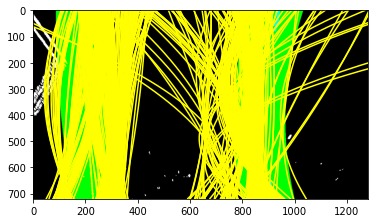

In [ ]:
# !gdown --id '12Kt2MKdFh17Wj2bOaP0tl466WCVUOdzk' --output lane_003.mp4


output = 'result_1484.mp4'
clip = VideoFileClip("MOV_1484.mp4")
print('finish VideoFileClip')

video_clip = clip.fl_image(process_image) 
print('finish clip.fl_image')

%time video_clip.write_videofile(output, audio=False, fps = 8) #fps => frames per second 
print('video_clip.write_videofile')

In [ ]:
!ls

1480.jpg  1484.jpg	  gdrive	   sample_data
1481.jpg  camera_cal	  MOV_1481.mp4	   test_images
1483.jpg  camera_cal.zip  result_1481.mp4  test_images.zip


broadcast the result vedio

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('result_1484.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

save video

In [ ]:
# to local
from google.colab import files
files.download('result_1484.mp4')